# Image captioning models - Compare results

In [12]:
import pandas as pd

In [13]:
# Set column names
col_names = ['image_name','generated_caption']

In [14]:
# Read generated captions from model trained with greedy search
df_greedy = pd.read_csv('childrensimages-caption-20231108.tsv',names=col_names,header=None,
                         sep='\t')

In [15]:
# Read generated captions from model trained with beam search
df_beam = pd.read_csv('childrensimages-caption-20231109.tsv',names=col_names,header=None,
                         sep='\t')

In [16]:
df_greedy.iloc[1]['generated_caption']

'drawing of a mouse by a christmas tree with the title " merry christmas, amelia berenia "'

In [17]:
df_beam.iloc[1]['generated_caption']

'drawing of a girl decorating a christmas tree with the captions " merry little islands, ameliaia " and " the caption "'

In [18]:
# Join dataframes by image_name
df = pd.merge(df_greedy, df_beam, on='image_name', how='inner')
df.rename(columns={'generated_caption_x': 'caption_greedy',
                   'generated_caption_y': 'caption_beam'}, inplace=True)

In [19]:
from difflib import SequenceMatcher

# Get similarity between strings
def similar(a, b):
    return SequenceMatcher(None, a, b).ratio()

The similarity ratio ranges from 0.0 to 1.0, where 1.0 indicates that the strings are identical, and lower values indicate less similarity. The ratio() method calculates the similarity by comparing the longest contiguous matching subsequence of characters between the two strings.

In [20]:
# Compute similarity between generated captions from the two models
df['captions_similarity'] = df.apply(lambda x: similar(x['caption_greedy'],
                                                       x['caption_beam']), axis=1)

In [21]:
df['captions_similarity'].describe()

count    190.000000
mean       0.825384
std        0.114783
min        0.419355
25%        0.764342
50%        0.841342
75%        0.918187
max        1.000000
Name: captions_similarity, dtype: float64

Compute general comparisons of similarity

In [22]:
from PIL import Image

# Function to display an image given its full path
def display_image(img_full_path):
    image = Image.open(img_full_path)
    width, height = image.size
    display(image.resize((int(0.4*width), int(0.4*height))))

In [23]:
img_root_path = '../Datasets/childrens-books-test/'

In [24]:
# Function to compare results for an image
def compare_captions(idx):
    idx_row = df.loc[idx]
    idx_img = idx_row['image_name']
    idx_sim = idx_row['captions_similarity']
    idx_greedy = idx_row['caption_greedy']
    idx_beam = idx_row['caption_beam']
    
    # Print the results
    print("\033[1mSimilarity at index {0}: {1}\033[0m".format(idx, idx_sim))
    print("\033[1mImage name:\033[0m",idx_img)
    display_image(img_root_path + idx_img)
    print("\033[1mGreedy:\033[0m",idx_greedy)
    print("\033[1mBeam:\033[0m",idx_beam)
    print()

In [25]:
# Find the minimum similarity value
min_similarity_value = df['captions_similarity'].min()

# Use boolean indexing to retrieve all rows where "caption_similarity" is equal to the minimum value
min_similarity_rows = df[df['captions_similarity'] == min_similarity_value]

# Extract the indexes from the resulting DataFrame
min_similarity_indexes = min_similarity_rows.index.tolist()

In [26]:
# Find the maximum similarity value
max_similarity_value = df['captions_similarity'].max()

# Use boolean indexing to retrieve all rows where "caption_similarity" is equal to the maximum value
max_similarity_rows = df[df['captions_similarity'] == max_similarity_value]

# Extract the indexes from the resulting DataFrame
max_similarity_indexes = max_similarity_rows.index.tolist()

Similarity at index 177: 0.41935483870967744
Image name: 1627389512.jpg


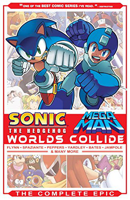

Greedy: drawing of a blue superhero with the title " sonic the battleman "
Beam: drawing of a man with blue hair and the captions " sonic nerd world collapsle " and " the end of the sonic world collaps

Similarity at index 10: 1.0
Image name: 0131891839.jpg


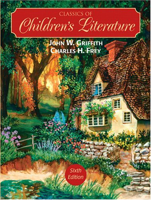

Greedy: drawing of a house in a garden with the title " children's literature "
Beam: drawing of a house in a garden with the title " children's literature "

Similarity at index 21: 1.0
Image name: 031612236X.jpg


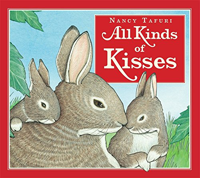

Greedy: drawing of two rabbits with the title " all kinds of kisses "
Beam: drawing of two rabbits with the title " all kinds of kisses "

Similarity at index 48: 1.0
Image name: 0531281574.jpg


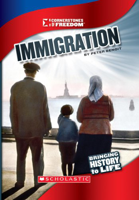

Greedy: picture of two adults and a child with the title " immigration "
Beam: picture of two adults and a child with the title " immigration "

Similarity at index 50: 1.0
Image name: 0544568052.jpg


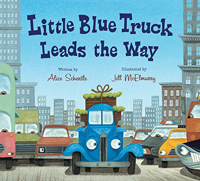

Greedy: drawing of a blue car in a city with the title " little blue truck leads the way "
Beam: drawing of a blue car in a city with the title " little blue truck leads the way "

Similarity at index 54: 1.0
Image name: 0545393876.jpg


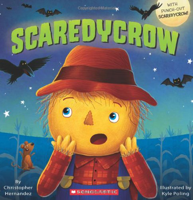

Greedy: drawing of a scarecrow with bats and the title " scarecrow "
Beam: drawing of a scarecrow with bats and the title " scarecrow "

Similarity at index 56: 1.0
Image name: 0545433878.jpg


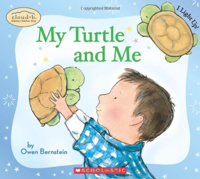

Greedy: drawing of a boy holding a turtle and the title " my turtle and me "
Beam: drawing of a boy holding a turtle and the title " my turtle and me "

Similarity at index 90: 1.0
Image name: 075669289X.jpg


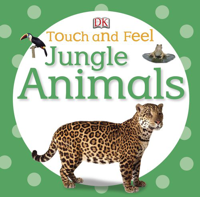

Greedy: picture of a leopard with the title " touch and feel jungle animals "
Beam: picture of a leopard with the title " touch and feel jungle animals "

Similarity at index 94: 1.0
Image name: 0762432195.jpg


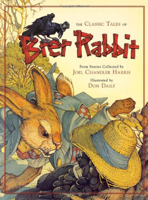

Greedy: drawing of a rabbit and a rabbit with the title " beer rabbit "
Beam: drawing of a rabbit and a rabbit with the title " beer rabbit "

Similarity at index 109: 1.0
Image name: 0794430120.jpg


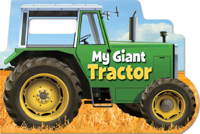

Greedy: picture of a green tractor with the title " my giant tractor "
Beam: picture of a green tractor with the title " my giant tractor "

Similarity at index 118: 1.0
Image name: 0823413934.jpg


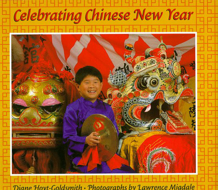

Greedy: picture of a boy holding a golden dragon and the title " celebrating chinese new year "
Beam: picture of a boy holding a golden dragon and the title " celebrating chinese new year "

Similarity at index 130: 1.0
Image name: 1404803483.jpg


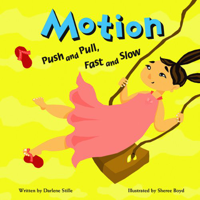

Greedy: drawing of a girl with a pink dress and the title " motion "
Beam: drawing of a girl with a pink dress and the title " motion "

Similarity at index 142: 1.0
Image name: 1442403527.jpg


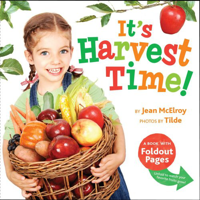

Greedy: picture of a girl holding a basket with fruits and the title " it's harvest time! "
Beam: picture of a girl holding a basket with fruits and the title " it's harvest time! "

Similarity at index 150: 1.0
Image name: 1479571660.jpg


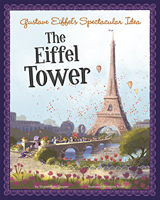

Greedy: drawing of the eiffel tower by the river with the title " the eiffel tower "
Beam: drawing of the eiffel tower by the river with the title " the eiffel tower "

Similarity at index 158: 1.0
Image name: 155885424X.jpg


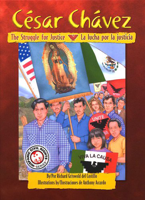

Greedy: drawing of people holding a flag and the title " the struggle for justice "
Beam: drawing of people holding a flag and the title " the struggle for justice "

Similarity at index 178: 1.0
Image name: 162832113X.jpg


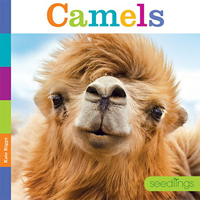

Greedy: picture of a camel with the title " camels "
Beam: picture of a camel with the title " camels "



In [27]:
# For the rows with the minimum similarity
for idx_min in min_similarity_indexes:
    compare_captions(idx_min)

# For the rows with the maximum similarity
for idx_max in max_similarity_indexes:
    compare_captions(idx_max)

Similarity at index 0: 0.8721804511278195
Image name: 0060086521.jpg


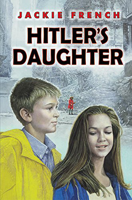

Greedy: drawing of a boy and a girl in the snow with the title " his daughter "
Beam: drawing of a boy and a girl with the title " nazi's daughter "

Similarity at index 1: 0.6570048309178744
Image name: 0060099453.jpg


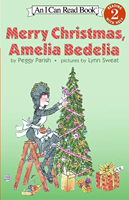

Greedy: drawing of a mouse by a christmas tree with the title " merry christmas, amelia berenia "
Beam: drawing of a girl decorating a christmas tree with the captions " merry little islands, ameliaia " and " the caption "

Similarity at index 2: 0.8535031847133758
Image name: 0060283262.jpg


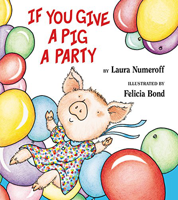

Greedy: drawing of a pig with balloons and the title " if you give a pig a party "
Beam: drawing of a pig and colorful balloons with the title " if you give a pig a party "

Similarity at index 3: 0.9156626506024096
Image name: 0060530898.jpg


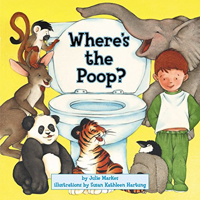

Greedy: drawing of children with animals in the toilet with the title " where's in the poop? "
Beam: drawing of children and animals in a toilet with the title " where's the poop? "

Similarity at index 4: 0.7850467289719626
Image name: 0062060090.jpg


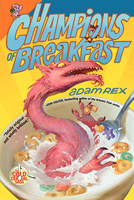

Greedy: drawing of a red monster with the title " i am breakfast "
Beam: drawing of a red dragon with the title " cimaos "

Similarity at index 5: 0.8834355828220859
Image name: 0062110624.jpg


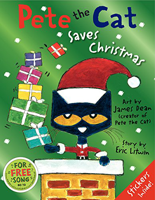

Greedy: drawing of a cat with a red hat and presents with the title " pete cat saves christmas "
Beam: drawing of a cat with a red hat and gifts with the title " save christmas "

Similarity at index 6: 0.9185185185185185
Image name: 0062110721.jpg


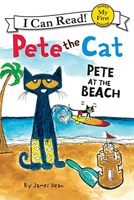

Greedy: drawing of a cat and a beach with the title " pete the cat at the beach "
Beam: drawing of a cat and a beach with the title " pete the beach "

Similarity at index 7: 0.8258064516129032
Image name: 0062221337.jpg


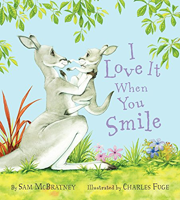

Greedy: drawing of two animals dancing in a garden with the title " i love it when you smile "
Beam: drawing of two kangaroos with the title " i love it, when you smile "

Similarity at index 8: 0.736
Image name: 0062270818.jpg


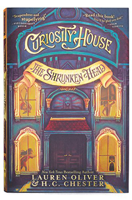

Greedy: drawing of a blue door and the title " the curious house "
Beam: drawing of a door with the title " curious house the screech head "

Similarity at index 9: 0.9298245614035088
Image name: 0078807239.jpg


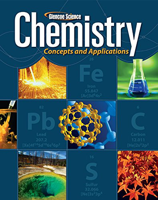

Greedy: picture of different objects with the title " chemistry "
Beam: pictures of different objects and the title " chemistry "

Similarity at index 10: 1.0
Image name: 0131891839.jpg


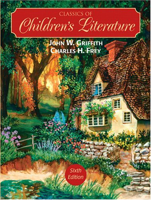

Greedy: drawing of a house in a garden with the title " children's literature "
Beam: drawing of a house in a garden with the title " children's literature "

Similarity at index 11: 0.7611940298507462
Image name: 0142414603.jpg


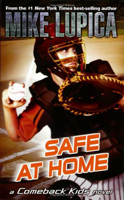

Greedy: picture of a boy with a helmet and the title " safe love "
Beam: picture of a boy with a mask and a baseball bat with the title " safe home "

Similarity at index 12: 0.8985507246376812
Image name: 0147513200.jpg


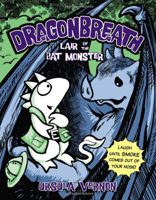

Greedy: drawing of a white dragon and a blue monster with the title " dragonheath "
Beam: drawing of a dragon and a monster with the title " dragonhead "

Similarity at index 13: 0.9256198347107438
Image name: 0147514940.jpg


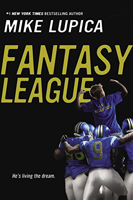

Greedy: picture of two players with the title " fantasy league "
Beam: picture of two football players with the title " fantasy league "

Similarity at index 14: 0.8484848484848485
Image name: 0152046968.jpg


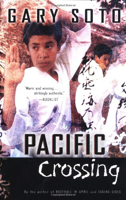

Greedy: picture of a boy and a boy with the title " pacific "
Beam: picture of two boys with the title " pacific "

Similarity at index 15: 0.7971014492753623
Image name: 0152427309.jpg


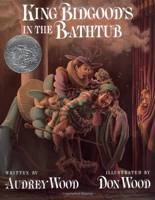

Greedy: drawing of a man, two girls, and a cat with the title " in the bathtub "
Beam: drawing of men and a little girl with the title " in the bathtub "

Similarity at index 16: 0.8740740740740741
Image name: 0199105332.jpg


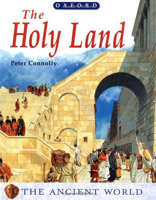

Greedy: drawing of people in a building by a door with the title " holy land "
Beam: drawing of people outside a building with the title " holy land "

Similarity at index 17: 0.9367088607594937
Image name: 0312492510.jpg


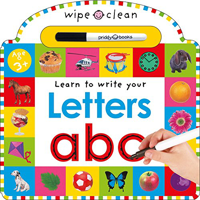

Greedy: picture of different objects and the title " learn to write your letters abc "
Beam: pictures of different objects and the title " learn to write your alphabet abc "

Similarity at index 18: 0.8113207547169812
Image name: 031251459X.jpg


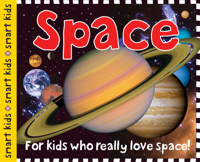

Greedy: picture of planets with the title " space "
Beam: picture of planets of the solar system with the title " space "

Similarity at index 19: 0.928
Image name: 0316011185.jpg


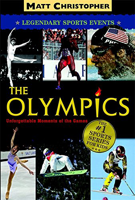

Greedy: pictures of olympic athletes and the title " the olympic olympics "
Beam: picture of athletes and the title " the olympic olympics "

Similarity at index 20: 0.5783132530120482
Image name: 0316080209.jpg


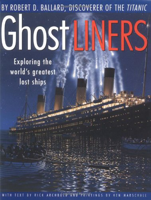

Greedy: picture of a building with smoke and the title " ghost liners "
Beam: picture of a ship in the sea with the title " ghost lines exploring the world is greatest, lost ships "

Similarity at index 21: 1.0
Image name: 031612236X.jpg


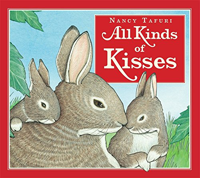

Greedy: drawing of two rabbits with the title " all kinds of kisses "
Beam: drawing of two rabbits with the title " all kinds of kisses "

Similarity at index 22: 0.6878980891719745
Image name: 0316142239.jpg


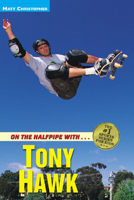

Greedy: picture of a skateboarder with the title " on the armless skateboard with... on the edge of.. "
Beam: picture of a skateboarder with the title " on the half - air "

Similarity at index 23: 0.9182389937106918
Image name: 031620692X.jpg


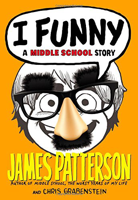

Greedy: drawing of a face with glasses and the title " i penny a middle school story "
Beam: drawing of a face with glasses and the captions " i funny a middle school story "

Similarity at index 24: 0.8607594936708861
Image name: 0316853127.jpg


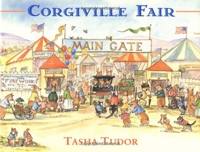

Greedy: drawing of a fair with people and animals at the gate " cournie fair "
Beam: drawing of a fair with people and animals in a market with the title " cournville fair "

Similarity at index 25: 0.975
Image name: 0374301115.jpg


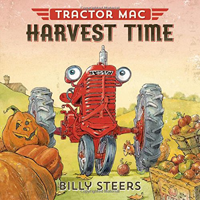

Greedy: drawing of a red tractor and a pumpkin with the title " tractor harvest time "
Beam: drawing of a red tractor and a pumpkin with the title " tractor mac harvest time "

Similarity at index 26: 0.8098159509202454
Image name: 0375803467.jpg


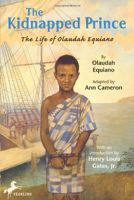

Greedy: drawing of a boy with a striped shirt and the title " the life of ocalae "
Beam: drawing of a boy with a striped dress and a ship with the title " the life of ouluquian "

Similarity at index 27: 0.8031496062992126
Image name: 0375814043.jpg


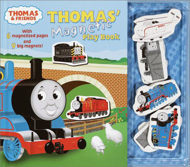

Greedy: drawing of a train and the title " thomas'magnets playbook "
Beam: drawing of a train and two trains with the title " thomas'magneto "

Similarity at index 28: 0.8717948717948718
Image name: 0375844422.jpg


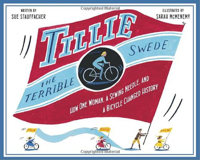

Greedy: drawing of a person riding a bicycle with the title " the terrible screech "
Beam: drawing of a person riding a bicycle and the title " tillie the terrible swede "

Similarity at index 29: 0.8761904761904762
Image name: 0375870202.jpg


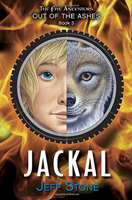

Greedy: drawing of a boy and a wolf with the title " jackal "
Beam: drawing of a girl and a wolf with the title " nala "

Similarity at index 30: 0.8651685393258427
Image name: 0385376162.jpg


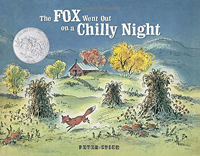

Greedy: drawing of a fox in a green field with the title " the fox won't out on a chilly night "
Beam: drawing of a dog in a field in a hill and the title " the fox won't out on a chill night "

Similarity at index 31: 0.8217054263565892
Image name: 0385384440.jpg


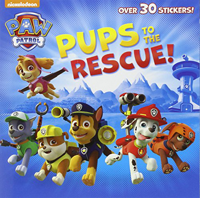

Greedy: drawing of animals with the title " pups to the rescue! "
Beam: drawing of a dog and a helicopter with the title " pups to the rescue! "

Similarity at index 32: 0.92
Image name: 038575583X.jpg


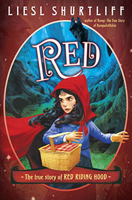

Greedy: drawing of a girl with a red hood and a basket in a forest with the title " red "
Beam: drawing of a girl with a red hood and a basket with the title " red "

Similarity at index 33: 0.9346733668341709
Image name: 0394826817.jpg


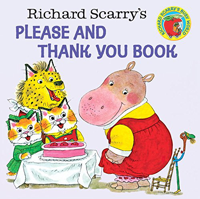

Greedy: drawing of a pig, a pig, and a cat eating with the title " richard scarry's please and thank you book "
Beam: drawing of a pig, a cat, and a cat with the title " richard scarry's please and thank you book "

Similarity at index 34: 0.72
Image name: 0395349249.jpg


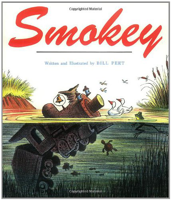

Greedy: drawing of a man riding a horse by a river with the title " smokey "
Beam: drawing of a moose in an island with the title " smokey "

Similarity at index 35: 0.8489208633093526
Image name: 0395621550.jpg


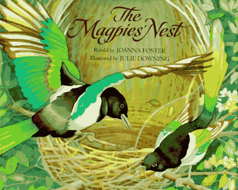

Greedy: drawing of two birds in a nest with the title " the magic of the magbs nest "
Beam: drawing of a bird in nest with the title " the magpie's nest "

Similarity at index 36: 0.6185567010309279
Image name: 0431186367.jpg


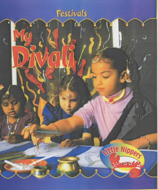

Greedy: picture of children and the title " my diwali "
Beam: drawing of two girls with the title " my diwali! "

Similarity at index 37: 0.8983957219251337
Image name: 0439669960.jpg


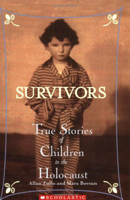

Greedy: picture of a boy with striped pajamas and the title " survival stories true stories of children "
Beam: picture of a boy with striped clothes and the title " survivors true stories of children "

Similarity at index 38: 0.6666666666666666
Image name: 0439770831.jpg


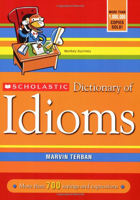

Greedy: drawing of a boy in a desk with the title " school dictionary of indians "
Beam: drawing of an alphabeton in an orange box with the title " iamble of delinons "

Similarity at index 39: 0.7787610619469026
Image name: 0448464616.jpg


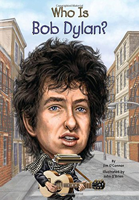

Greedy: drawing of a woman's face in a city with the title " bob birkle "
Beam: drawing of a man with the title " bob biltmore "

Similarity at index 40: 0.7704918032786885
Image name: 0448479532.jpg


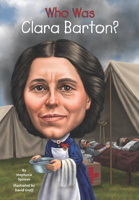

Greedy: drawing of a woman with the title " once a barbell "
Beam: drawing of a woman with a white dress and the title " mary's barbell "

Similarity at index 41: 0.8701298701298701
Image name: 0486401448.jpg


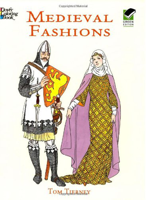

Greedy: drawing of a man and a woman with a shield and the title " fashions "
Beam: drawing of a knight and a woman with a shield and a dress with the title " fashions "

Similarity at index 42: 0.6666666666666666
Image name: 048647285X.jpg


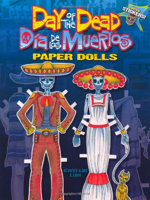

Greedy: drawing of two robots with hats and the title " de mures "
Beam: drawing of a man and a woman with hats and the title " the daelios paper dolls "

Similarity at index 43: 0.7058823529411765
Image name: 0516271717.jpg


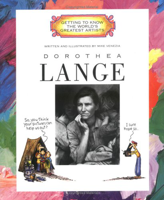

Greedy: drawing of a woman with her face in a frame with the title " dork lage "
Beam: drawing of a woman with the title " dolachtia "

Similarity at index 44: 0.9790209790209791
Image name: 0525428119.jpg


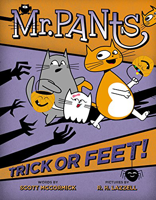

Greedy: drawing of two cats and a cat with the title " mr. pants trick or feet! "
Beam: drawing of two cats and a cat with the title " mr. pants trick feet! "

Similarity at index 45: 0.8527131782945736
Image name: 0531212726.jpg


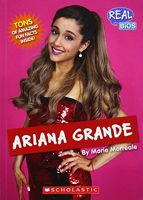

Greedy: picture of a woman with a red dress and the title " serena grande "
Beam: picture of a girl with red dress and the title " alia grande "

Similarity at index 46: 0.8556701030927835
Image name: 0531220559.jpg


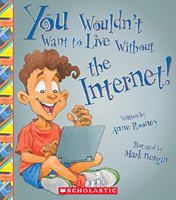

Greedy: drawing of a boy holding a book with the title " you wouldn't want to live without the internet! "
Beam: drawing of a boy with a laptop and the title " you wouldn't want to live without the internet! "

Similarity at index 47: 0.7407407407407407
Image name: 0531222098.jpg


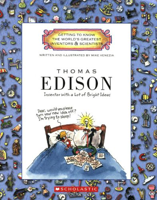

Greedy: drawing of a man and a woman in a bed with the caption " thomas edison "
Beam: drawing of a boy and a boy in a bed with different objects and the title " thomas edison "

Similarity at index 48: 1.0
Image name: 0531281574.jpg


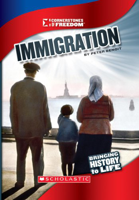

Greedy: picture of two adults and a child with the title " immigration "
Beam: picture of two adults and a child with the title " immigration "

Similarity at index 49: 0.8992248062015504
Image name: 0544340477.jpg


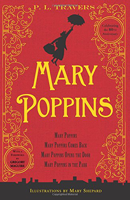

Greedy: drawing of a girl with a red background and the title " mary poppies "
Beam: drawing of a girl with a dog and the title " mary poppies "

Similarity at index 50: 1.0
Image name: 0544568052.jpg


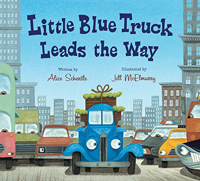

Greedy: drawing of a blue car in a city with the title " little blue truck leads the way "
Beam: drawing of a blue car in a city with the title " little blue truck leads the way "

Similarity at index 51: 0.918918918918919
Image name: 0545130484.jpg


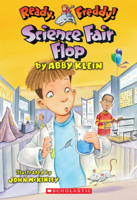

Greedy: drawing of a boy holding a flask with the title " science fair hopi "
Beam: drawing of a boy holding a flask and a boy with the title " science fair hops "

Similarity at index 52: 0.8023255813953488
Image name: 0545206944.jpg


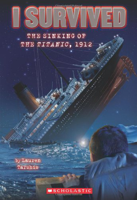

Greedy: drawing of a ship sinking in the sea with the title " the sinking of the titanic "
Beam: drawing of a boy and a girl by the sea with the title " the sinking of the titanic, 1911 "

Similarity at index 53: 0.954954954954955
Image name: 0545348307.jpg


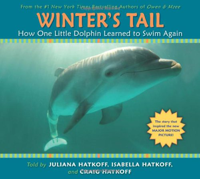

Greedy: picture of a dolphin with the title " winter's tail "
Beam: picture of a dolphin with the title " winter's tail tall "

Similarity at index 54: 1.0
Image name: 0545393876.jpg


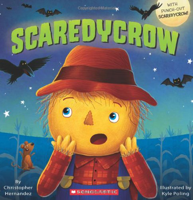

Greedy: drawing of a scarecrow with bats and the title " scarecrow "
Beam: drawing of a scarecrow with bats and the title " scarecrow "

Similarity at index 55: 0.8979591836734694
Image name: 0545416787.jpg


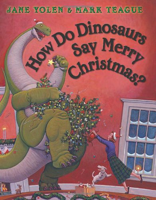

Greedy: drawing of a dinosaur holding a garland with the title " how do dinosaurs say merry christmas? "
Beam: drawing of a green dinosaur holding a candle and the title " how do dinosaurs say merry christmas? "

Similarity at index 56: 1.0
Image name: 0545433878.jpg


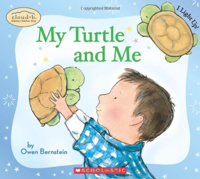

Greedy: drawing of a boy holding a turtle and the title " my turtle and me "
Beam: drawing of a boy holding a turtle and the title " my turtle and me "

Similarity at index 57: 0.8538011695906432
Image name: 0545509157.jpg


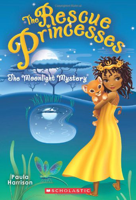

Greedy: drawing of a girl in a yellow dress and a cat with the title " princesses "
Beam: drawing of a girl with a yellow dress and a wolf in a night forest with the title " princesses "

Similarity at index 58: 0.8421052631578947
Image name: 0545556740.jpg


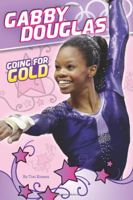

Greedy: picture of a girl dancing with the title " going for gold "
Beam: picture of a smiling girl holding a gold with the title " going for gold "

Similarity at index 59: 0.7480916030534351
Image name: 0545663849.jpg


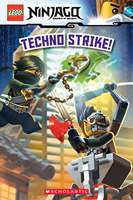

Greedy: drawing of two masked men and a green dragon with the title " cyber strike! "
Beam: drawing of two robots with the title " cyber strike! "

Similarity at index 60: 0.7948717948717948
Image name: 0545700272.jpg


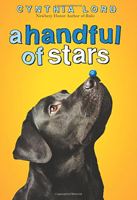

Greedy: picture of a black dog with a blue ball below the title " ayunch of stars "
Beam: picture of a dog with a blue ball in its mouth and the title " ayurful of stars "

Similarity at index 61: 0.9230769230769231
Image name: 0545820111.jpg


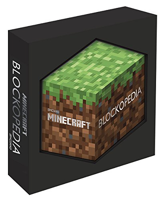

Greedy: drawing of a green and brown cube with the caption " minecraft blockia "
Beam: drawing of a green and brown cube with the captions " minecraft block encyclopedia "

Similarity at index 62: 0.8035714285714286
Image name: 0547318367.jpg


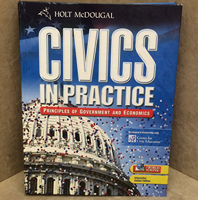

Greedy: picture of a building with the title " civic impassion "
Beam: drawing of a building with the title " civic impedence "

Similarity at index 63: 0.7435897435897436
Image name: 0553510851.jpg


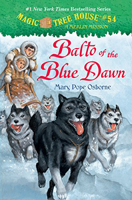

Greedy: drawing of dogs and a man with the title " bat of the blue dawn "
Beam: drawing of a woman, a man, and two dogs in a sled with the title " bulli of the blue dawn "

Similarity at index 64: 0.8421052631578947
Image name: 0553533967.jpg


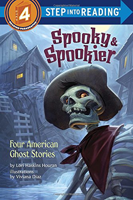

Greedy: drawing of a skeleton with a hat and the title " skull of spooky & spooky halloween stories "
Beam: drawing of a skeleton with a hat and the title " screech & halloween stories "

Similarity at index 65: 0.7758620689655172
Image name: 0553536923.jpg


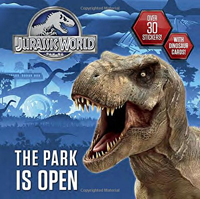

Greedy: drawing of a dinosaur with the caption " the park is open "
Beam: drawing of a dinosaur with the caption " dinosaur world "

Similarity at index 66: 0.8102564102564103
Image name: 0578135108.jpg


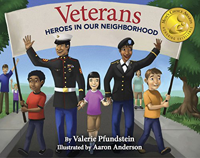

Greedy: drawing of two men and a girl holding a flag with the title " veterans heroes in our neighborhood "
Beam: drawing of a man and two children with the title " veterans " and " heroes in our neighborhood "

Similarity at index 67: 0.8342857142857143
Image name: 0613721209.jpg


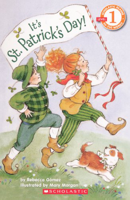

Greedy: drawing of a boy and a girl dressed in green with a dog and the title " st. patrick's day "
Beam: drawing of a boy and a girl dancing with a green hat and the title " st. patrick's "

Similarity at index 68: 0.9485714285714286
Image name: 0618065679.jpg


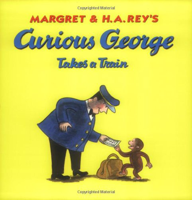

Greedy: drawing of a man with a hat and a train with the title " curious george takes a train "
Beam: drawing of a man with a hat and a monkey with the title " curious george takes a train "

Similarity at index 69: 0.7706422018348624
Image name: 0618225706.jpg


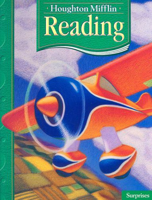

Greedy: drawing of a colorful bird and the title " reading "
Beam: picture of a colorful airplane with the title " reading "

Similarity at index 70: 0.8125
Image name: 061825627X.jpg


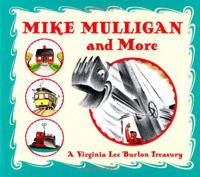

Greedy: drawing of a bulldozer and a house with the title " mike mulan and more "
Beam: drawing of a man with a metal mask and a house with the title " mike mulanan and more "

Similarity at index 71: 0.7142857142857143
Image name: 0618428852.jpg


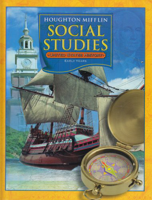

Greedy: drawing of a ship and a compass with the title " social studies "
Beam: picture of a ship with sails and the title " social studies "

Similarity at index 72: 0.8226950354609929
Image name: 0618603875.jpg


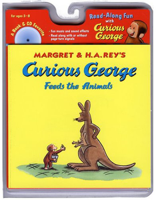

Greedy: drawing of a brown kangaroo and a mouse with the title " curious george "
Beam: drawing of a monkey and a kangaroo with the title " curious george "

Similarity at index 73: 0.78125
Image name: 0679423133.jpg


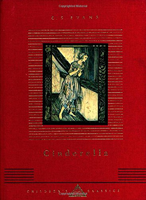

Greedy: drawing of a woman with a dress and the title " ballerina "
Beam: drawing of a woman with a red background and the title " cinderella "

Similarity at index 74: 0.8461538461538461
Image name: 0679847596.jpg


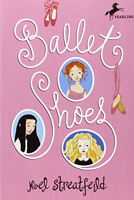

Greedy: drawing of girls and colorful shoes with the title " ballet shoes "
Beam: drawing of girls and skateboard with the title " ballet shoes "

Similarity at index 75: 0.7837837837837838
Image name: 0684922967.jpg


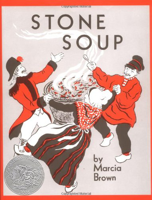

Greedy: drawing of two men and a woman with red clothes with the title " stone soup "
Beam: drawing of two womans dancing with a bowl with the title " stone soup "

Similarity at index 76: 0.7301587301587301
Image name: 0688135765.jpg


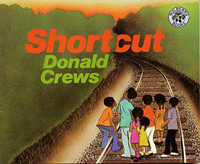

Greedy: drawing of children and a man in a stairs with the title " shortcut john crews "
Beam: drawing of children and the title " shortcut "

Similarity at index 77: 0.954248366013072
Image name: 0689806272.jpg


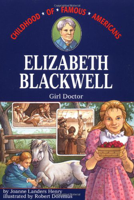

Greedy: drawing of a girl holding a basket with apples and the title " elizabethan "
Beam: drawing of a girl holding a basket with animals and the title " elizabethan "

Similarity at index 78: 0.7819548872180451
Image name: 0689815565.jpg


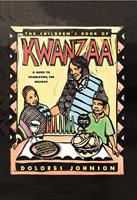

Greedy: drawing of two adults and a child with the title " kwanzaa "
Beam: drawing of a woman and two children at a table with the title " kwanzaa "

Similarity at index 79: 0.8531468531468531
Image name: 0689839294.jpg


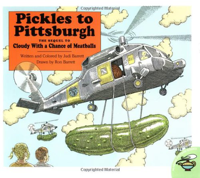

Greedy: drawing of a helicopter with the title " pickles to pittsburgh "
Beam: drawing of a helicopter with pickles and the captions " pickles to pittsburgh "

Similarity at index 80: 0.9230769230769231
Image name: 0689851928.jpg


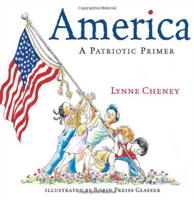

Greedy: drawing of people holding a flag and the title " america a patriotic primer "
Beam: drawing of children holding a flag and the title " america a patriotic primer "

Similarity at index 81: 0.897196261682243
Image name: 0689858817.jpg


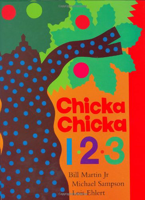

Greedy: drawing of a chicken with the title " chicken nukina "
Beam: drawing of a chicken with the title " chickena 2. 3 "

Similarity at index 82: 0.9421487603305785
Image name: 0689859228.jpg


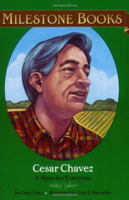

Greedy: drawing of a man with a plaid shirt and the title " man's face "
Beam: drawing of a man with a plaid shirt and the title " man "

Similarity at index 83: 0.6956521739130435
Image name: 0714863890.jpg


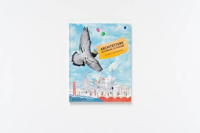

Greedy: drawing of a bird in the sky with the title " architecture "
Beam: drawing of a bird flying and the title " articulation "

Similarity at index 84: 0.9523809523809523
Image name: 0736430512.jpg


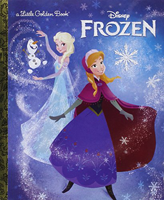

Greedy: drawing of a girl in blue dress and a snowman with the title " frozen "
Beam: drawing of two girls in blue dresses and a snowman with the title " frozen "

Similarity at index 85: 0.9577464788732394
Image name: 0736430806.jpg


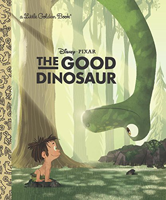

Greedy: drawing of a boy and a dinosaur with the title " the good dinosaur "
Beam: drawing of a boy and a green dinosaur with the title " the good dinosaur "

Similarity at index 86: 0.5850340136054422
Image name: 0736809260.jpg


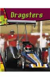

Greedy: picture of a person with a helmet and the title " the major league of the cinereousos "
Beam: picture of a person in a motorcycle with the title " dmnos "

Similarity at index 87: 0.732824427480916
Image name: 0746020619.jpg


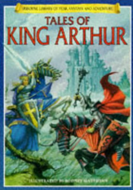

Greedy: drawing of two warriors with the title " king arthur "
Beam: drawing of a dragon and a man with red clothes with the title " king arthur "

Similarity at index 88: 0.8307692307692308
Image name: 0753453045.jpg


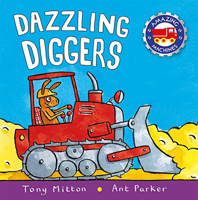

Greedy: drawing of a dog on a red tractor with the title " shining diggingrs "
Beam: drawing of a red tractor with the title " dazzling diggers "

Similarity at index 89: 0.8431372549019608
Image name: 0756545102.jpg


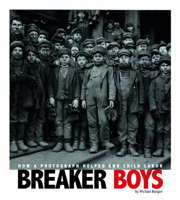

Greedy: picture of men with hats and the title " breaker boys "
Beam: picture of boys with the title " breaker boys "

Similarity at index 90: 1.0
Image name: 075669289X.jpg


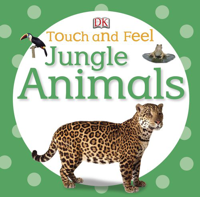

Greedy: picture of a leopard with the title " touch and feel jungle animals "
Beam: picture of a leopard with the title " touch and feel jungle animals "

Similarity at index 91: 0.9565217391304348
Image name: 0761149120.jpg


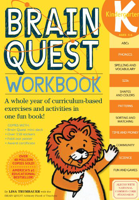

Greedy: drawing of a lion with the title " dream quest workbook "
Beam: drawing of a lion with the title " dragon quest workbook "

Similarity at index 92: 0.8571428571428571
Image name: 0761444068.jpg


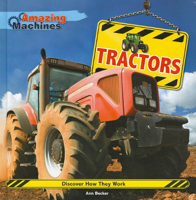

Greedy: picture of a red tractor with the title " amazing tractors "
Beam: picture of a red tractor and the title " amazing machines "

Similarity at index 93: 0.9316770186335404
Image name: 0761444831.jpg


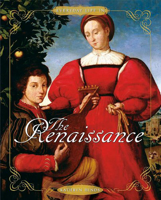

Greedy: drawing of a man and a woman with red clothes below the title " the renaissance "
Beam: drawing of a woman and a man with red clothes with the title " the renaissance "

Similarity at index 94: 1.0
Image name: 0762432195.jpg


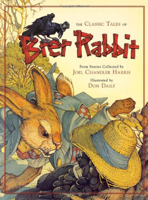

Greedy: drawing of a rabbit and a rabbit with the title " beer rabbit "
Beam: drawing of a rabbit and a rabbit with the title " beer rabbit "

Similarity at index 95: 0.7755102040816326
Image name: 0763632473.jpg


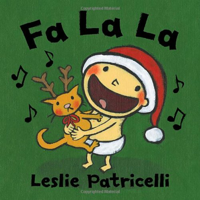

Greedy: drawing of a baby with a red hat holding a yellow cat and the title " fa la "
Beam: drawing of a cat with a red hat and a deer with the title " fa la la "

Similarity at index 96: 0.6433566433566433
Image name: 0763652326.jpg


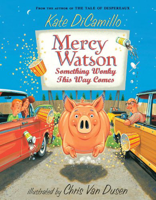

Greedy: drawing of a pig in a car with the title " mercy wilson "
Beam: drawing of a pig with people in the back of a red truck and the title " mercy watson "

Similarity at index 97: 0.5822784810126582
Image name: 0763654116.jpg


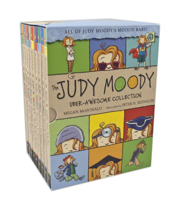

Greedy: drawing of different colorful objects with the caption " the junie fuzzy "
Beam: drawing of children, a dog, and other animals with the title " the " charlie moody "

Similarity at index 98: 0.6792452830188679
Image name: 0763660701.jpg


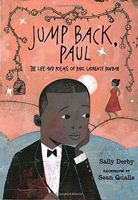

Greedy: drawing of a man with black suit and a girl below the caption " jump back, paul "
Beam: drawing of a boy and a girl with a red dress and the title " jump back, paul "

Similarity at index 99: 0.7903225806451613
Image name: 0763669288.jpg


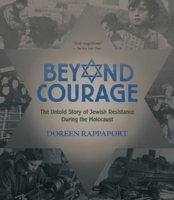

Greedy: picture of a crowd with the title " beyond courage "
Beam: picture of abstract objects and people with the title " beyond courage "

Similarity at index 100: 0.8461538461538461
Image name: 076601777X.jpg


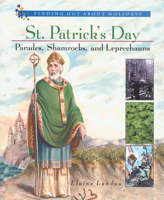

Greedy: drawing of a man holding a stick with the title " st. patrick's day "
Beam: drawing of a man holding a green suit with a castle and the title " st. patrick's day "

Similarity at index 101: 0.9180327868852459
Image name: 0766033031.jpg


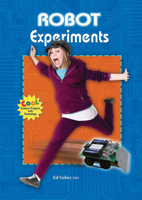

Greedy: picture of a girl dancing with the title " experiments "
Beam: picture of a girl dancing and a car with the title " experiments "

Similarity at index 102: 0.9746835443037974
Image name: 077105629X.jpg


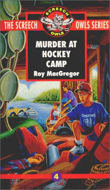

Greedy: drawing of a boy in a boat by the river with the title " murder at hockey camp "
Beam: drawing of a boy in a boat by a river with the title " murder at hockey camp "

Similarity at index 103: 0.8035714285714286
Image name: 0778712370.jpg


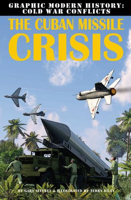

Greedy: picture of airplanes and a helicopter with the title " crisis "
Beam: picture of two airplanes and the title " crisis "

Similarity at index 104: 0.8987341772151899
Image name: 0778766292.jpg


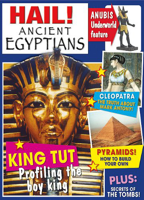

Greedy: picture of a golden egyptian head and a woman with the title " ancient egypt "
Beam: picture of ancient egyptian pharaoh and a woman with the title " ancient egypt "

Similarity at index 105: 0.7692307692307693
Image name: 0778783049.jpg


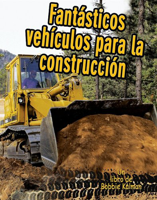

Greedy: picture of a yellow bulldozer and the title " bulldozers para paver "
Beam: picture of a yellow bulldozer and the title " velociraal la construction "

Similarity at index 106: 0.8198757763975155
Image name: 0781430747.jpg


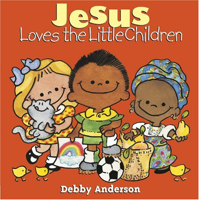

Greedy: drawing of children and the caption " jesus loves the little children "
Beam: drawing of children and a cat with toys with the title " jesus loves the little children "

Similarity at index 107: 0.5714285714285714
Image name: 0785166084.jpg


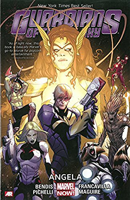

Greedy: drawing of a man with weapons and the title " warriors "
Beam: drawing of four superheroes with the title " marvel and the avengers "

Similarity at index 108: 0.8242424242424242
Image name: 0792266749.jpg


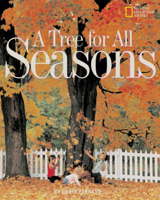

Greedy: picture of a tree and two trees with orange leaves with the title " a tree for seasons "
Beam: picture of a tree and a white fence with the title " a tree for all seasons "

Similarity at index 109: 1.0
Image name: 0794430120.jpg


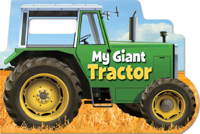

Greedy: picture of a green tractor with the title " my giant tractor "
Beam: picture of a green tractor with the title " my giant tractor "

Similarity at index 110: 0.7310344827586207
Image name: 0794506674.jpg


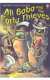

Greedy: drawing of men with hats and the title " forty three thieves "
Beam: drawing of men and a girl with blades riding a ship and the title " forty thieves "

Similarity at index 111: 0.8421052631578947
Image name: 0802775764.jpg


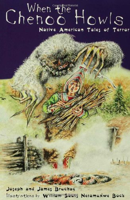

Greedy: drawing of a girl holding a stick in a forest with the title " the good place "
Beam: drawing of a girl holding a stick and a monster with the title " a girl "

Similarity at index 112: 0.9248554913294798
Image name: 0803733577.jpg


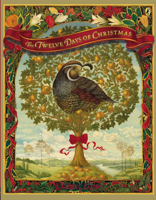

Greedy: drawing of a bird on a tree with apples and the title " the three days of christmas "
Beam: drawing of a turkey on a tree with apples and the title " the twelve days of christmas "

Similarity at index 113: 0.8671328671328671
Image name: 0803741367.jpg


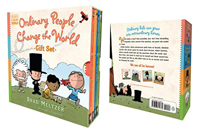

Greedy: drawing of children and a cat with the title " human people into the world "
Beam: drawing of children and the title " human people change the world "

Similarity at index 114: 0.8690476190476191
Image name: 080508990X.jpg


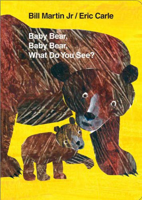

Greedy: drawing of a bear and a baby bear with the title " baby bear, baby bear, what do you see? "
Beam: drawing of two bears and the title " baby bear, baby bear, what do you see? "

Similarity at index 115: 0.8156424581005587
Image name: 0807534218.jpg


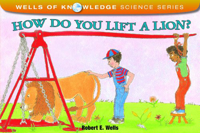

Greedy: drawing of a boy with a hat and a horse in a garden with the title " how do you lift a ladder "
Beam: drawing of a boy with a hat next to a lion with the title " how do you lift a lion "

Similarity at index 116: 0.84375
Image name: 0811817156.jpg


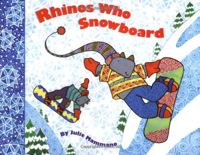

Greedy: drawing of two mice in the sky and the title " animals who snowboard "
Beam: drawing of two mice and the title " rhinos who snowboard "

Similarity at index 117: 0.948905109489051
Image name: 081605889X.jpg


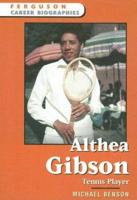

Greedy: picture of a woman holding a racket with the title " althea gibson "
Beam: picture of a man holding a racket with the title " atheaheal gibson "

Similarity at index 118: 1.0
Image name: 0823413934.jpg


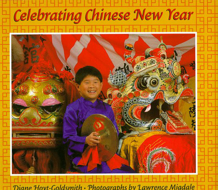

Greedy: picture of a boy holding a golden dragon and the title " celebrating chinese new year "
Beam: picture of a boy holding a golden dragon and the title " celebrating chinese new year "

Similarity at index 119: 0.8914285714285715
Image name: 0824603540.jpg


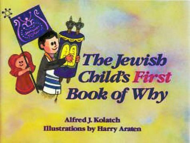

Greedy: drawing of a boy holding a book with the title " the david child's first book of why "
Beam: drawing of a boy holding a book and the title " the jewish children's first book of why "

Similarity at index 120: 0.89171974522293
Image name: 0874834228.jpg


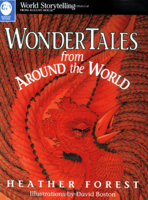

Greedy: picture of a red fish with the title " wonderful tales from around the world "
Beam: picture of an orange bird with the title " wonder tales from around the world "

Similarity at index 121: 0.75
Image name: 0877796769.jpg


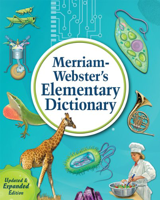

Greedy: drawing of a giraffe, a man, and animals with the title " merman's elementary dictionary "
Beam: drawing of a man, a man, and a musical instrument with the title " merman - middle school dictionary "

Similarity at index 122: 0.6046511627906976
Image name: 0887276407.jpg


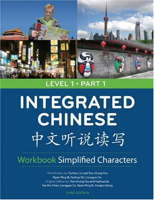

Greedy: picture of different chinese objects and the title " level 1 "
Beam: picture of a wall with symbols and the title " integrated chinese "

Similarity at index 123: 0.5851063829787234
Image name: 0888998074.jpg


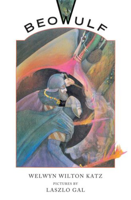

Greedy: drawing of a man with a blue hat and colorful clothes with the title " drawing of a man with the title " in the middle "
Beam: drawing of a man with a headdress and the title " art of the earth "

Similarity at index 124: 0.8615384615384616
Image name: 0937822833.jpg


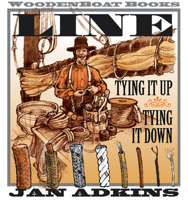

Greedy: drawing of a man with hat and working with the title " tie up, "
Beam: drawing of a man with hat and tools with the title " tying it up "

Similarity at index 125: 0.7777777777777778
Image name: 0974547700.jpg


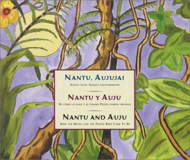

Greedy: drawing of a jungle with the title " nauuuu auuuuuuu "
Beam: drawing of a tropical tree with the title " nanuuuuu "

Similarity at index 126: 0.7209302325581395
Image name: 0979851114.jpg


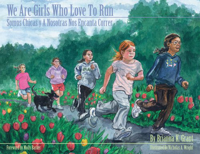

Greedy: drawing of children running in a flower field with the title " girls who love to run "
Beam: drawing of a girl running with a dog and the title " there are girls who love to run "

Similarity at index 127: 0.6729857819905213
Image name: 0991300319.jpg


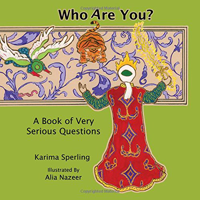

Greedy: drawing of a woman with a red dress and a book of very serious questions with the title " who are you? a book of very serious questions "
Beam: drawing of a man in a red dress and a bird with the title " who are you? "

Similarity at index 128: 0.8623853211009175
Image name: 1107615593.jpg


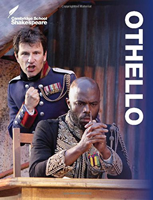

Greedy: picture of a man and a woman with the title " ohmi "
Beam: picture of a man and a man with the title " hello bello "

Similarity at index 129: 0.8662420382165605
Image name: 1250056942.jpg


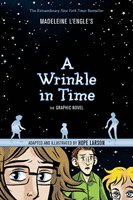

Greedy: drawing of a boy and a girl in a starry night with the title " a wrinkle in time "
Beam: drawing of three men in a starry night with the title " a wrinkle in time "

Similarity at index 130: 1.0
Image name: 1404803483.jpg


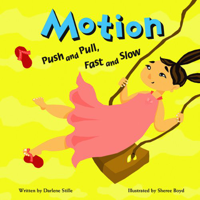

Greedy: drawing of a girl with a pink dress and the title " motion "
Beam: drawing of a girl with a pink dress and the title " motion "

Similarity at index 131: 0.8
Image name: 140952230X.jpg


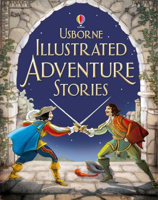

Greedy: drawing of two men with yellow clothes and the title " usborne illustrated adventure stories "
Beam: drawing of two men holding swords and the title " illustrated adventure stories "

Similarity at index 132: 0.7943262411347518
Image name: 141698514X.jpg


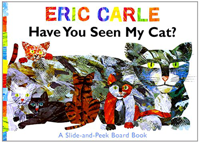

Greedy: drawing of a cat and a cat with the title " erithe have you seen my cat "
Beam: drawing of different animals with the title " have you seen my cat "

Similarity at index 133: 0.8831168831168831
Image name: 1421550059.jpg


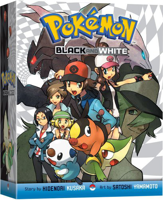

Greedy: drawing of children and animals with the title " pokemon black and white "
Beam: drawing of a boy, a girl, and animals with the title " pokemon black and white "

Similarity at index 134: 0.7943262411347518
Image name: 1423142004.jpg


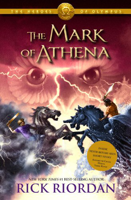

Greedy: drawing of two men in a horse and a lightning with the title " the mark of althea "
Beam: drawing of two horses and the title " the mark of athena "

Similarity at index 135: 0.9217391304347826
Image name: 1426308051.jpg


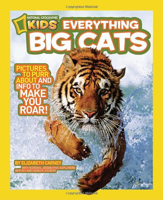

Greedy: picture of a tiger with the title " everything cats "
Beam: picture of a tiger with the title " kids everything big cats "

Similarity at index 136: 0.582089552238806
Image name: 142631020X.jpg


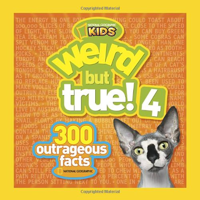

Greedy: drawing of a dog with the title " weird but true! "
Beam: picture of a cat with the captions " weird but true! " and " 300 outrageous facts "

Similarity at index 137: 0.6835443037974683
Image name: 142631518X.jpg


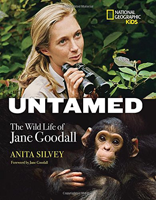

Greedy: picture of a woman holding a camera and a monkey with the title " the wild life of jane gorg gorg "
Beam: picture of a woman and a monkey with the title " unrealed "

Similarity at index 138: 0.7777777777777778
Image name: 1429692669.jpg


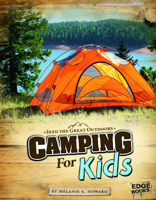

Greedy: drawing of a tent by a river and the title " camping for kids "
Beam: picture of a tent by a lake with the title " camping for kids "

Similarity at index 139: 0.9380530973451328
Image name: 1434227804.jpg


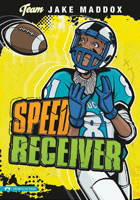

Greedy: drawing of a football player and the caption " speeder "
Beam: drawing of a football player with the caption " speeder "

Similarity at index 140: 0.9481481481481482
Image name: 1434297330.jpg


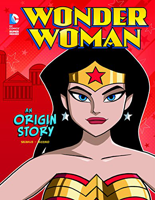

Greedy: drawing of a woman with a golden cape and the title " wonder woman "
Beam: drawing of a woman with a golden wig and the title " wonder woman "

Similarity at index 141: 0.7559055118110236
Image name: 1435855027.jpg


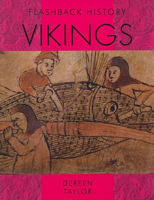

Greedy: drawing of people and a man in a boat with the title " viking "
Beam: drawing of men and a woman with sticks and the title " vikings "

Similarity at index 142: 1.0
Image name: 1442403527.jpg


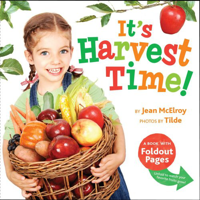

Greedy: picture of a girl holding a basket with fruits and the title " it's harvest time! "
Beam: picture of a girl holding a basket with fruits and the title " it's harvest time! "

Similarity at index 143: 0.6623376623376623
Image name: 1442412704.jpg


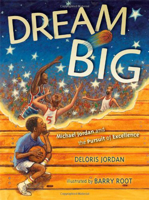

Greedy: drawing of people playing basketball and the title " dream big "
Beam: drawing of a boy and a girl surrounded by basketball players below the title " dream big "

Similarity at index 144: 0.7831325301204819
Image name: 1442472898.jpg


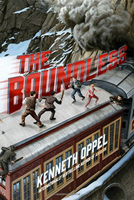

Greedy: drawing of two men and a girl in a train with the title " the four bounds "
Beam: drawing of two men and a girl on a roof with the title " the wick between the two bunnies "

Similarity at index 145: 0.926829268292683
Image name: 1452143196.jpg


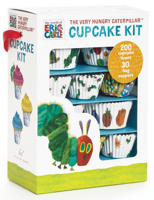

Greedy: drawing of a green caterpig with the title " cupcake kit "
Beam: drawing of a green caterpi cupcake with the title " cupcake kit "

Similarity at index 146: 0.7724137931034483
Image name: 146541729X.jpg


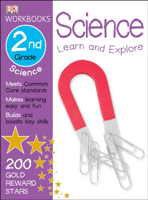

Greedy: picture of a red magnet with the title " 2nd grade science "
Beam: picture of a magnet and a star with the title " 2nd grade science learn and explore "

Similarity at index 147: 0.7758620689655172
Image name: 1467713120.jpg


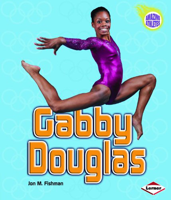

Greedy: picture of a girl dancing with the title " baby bump "
Beam: picture of a girl dancing with the caption " gay dicky dicky "

Similarity at index 148: 0.8943089430894309
Image name: 146774493X.jpg


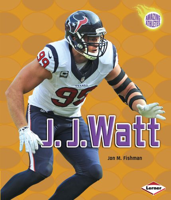

Greedy: picture of an american football player with the title " j. j. watt "
Beam: picture of a football player with the title " j. watt "

Similarity at index 149: 0.7039106145251397
Image name: 1477550291.jpg


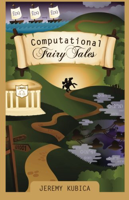

Greedy: drawing of a girl in a hill and a house with the title " compostable fairy tales "
Beam: drawing of a girl riding a horse in a forest with a bridge and the title " computer fairy tales "

Similarity at index 150: 1.0
Image name: 1479571660.jpg


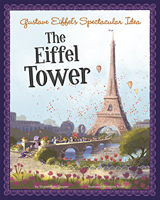

Greedy: drawing of the eiffel tower by the river with the title " the eiffel tower "
Beam: drawing of the eiffel tower by the river with the title " the eiffel tower "

Similarity at index 151: 0.8309859154929577
Image name: 1481435779.jpg


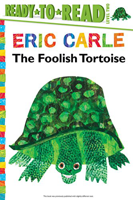

Greedy: drawing of a green turtle with the title " erobot the folk turtle "
Beam: drawing of a green turtle with the title " andy carl the foolish tortoise "

Similarity at index 152: 0.7938931297709924
Image name: 148472495X.jpg


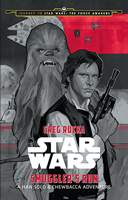

Greedy: drawing of a man and a star wars with the title " star wars "
Beam: drawing of a man with a mask and a monkey with the title " star wars "

Similarity at index 153: 0.7027027027027027
Image name: 1495929426.jpg


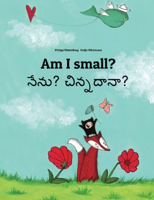

Greedy: drawing of a girl with a red dress and a butterfly with the title " am i small? "
Beam: drawing of a cat holding a red flower and the title " am i small? "

Similarity at index 154: 0.7471264367816092
Image name: 1508901015.jpg


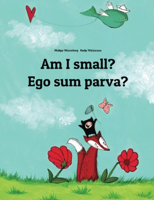

Greedy: drawing of a girl with a red dress and a butterfly with the title " am i small? egg sum? "
Beam: drawing of a rabbit with a butterfly and the title " am i small? omg sum parallaa? "

Similarity at index 155: 0.5492957746478874
Image name: 1517720621.jpg


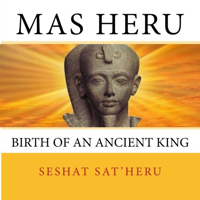

Greedy: picture of a head with the title " masseiur " and " birth of an ancient king "
Beam: picture of a statue of an ancient king with the title " mashup "

Similarity at index 156: 0.7627118644067796
Image name: 1550417649.jpg


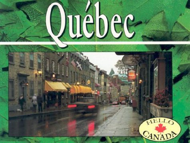

Greedy: picture of a street with buildings and the title " que quebec "
Beam: picture of a street in a city with the title " quebec "

Similarity at index 157: 0.9302325581395349
Image name: 1558747435.jpg


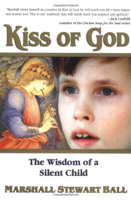

Greedy: drawing of a girl with a headdress and the title " kiss of god "
Beam: drawing of a woman with a headdress and the title " kiss of god "

Similarity at index 158: 1.0
Image name: 155885424X.jpg


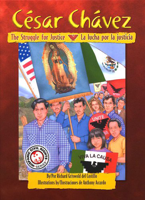

Greedy: drawing of people holding a flag and the title " the struggle for justice "
Beam: drawing of people holding a flag and the title " the struggle for justice "

Similarity at index 159: 0.8405797101449275
Image name: 1560653299.jpg


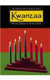

Greedy: picture of a chandelier with candles and the title " kwanzaa "
Beam: picture of a red and green background with candles and the title " kwanzaa "

Similarity at index 160: 0.8976377952755905
Image name: 1561380628.jpg


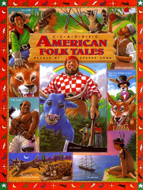

Greedy: drawing of animals with the title " american folk tales "
Beam: drawing of four men and animals with the title " american folk tales "

Similarity at index 161: 0.9213483146067416
Image name: 1563832747.jpg


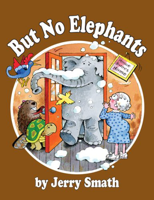

Greedy: drawing of an elephant, a turtle, and a turtle in a red door with the title " but no elephants "
Beam: drawing of an elephant, a turtle, and a turtle with the title " but no elephants "

Similarity at index 162: 0.9583333333333334
Image name: 1570916969.jpg


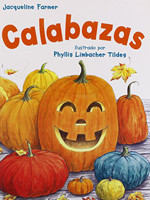

Greedy: drawing of a pumpkin with the title " calaveras "
Beam: drawing of a pumpkin with the title " calasas "

Similarity at index 163: 0.8794326241134752
Image name: 1572551348.jpg


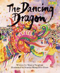

Greedy: drawing of a colorful dragon and the title " the dancing dragon "
Beam: drawing of a colorful dragon and people with the title " the vasing dragon "

Similarity at index 164: 0.9166666666666666
Image name: 1575054876.jpg


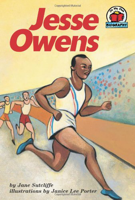

Greedy: drawing of a man running and the title " owen "
Beam: drawing of a man running with the title " owens "

Similarity at index 165: 0.9047619047619048
Image name: 1579121640.jpg


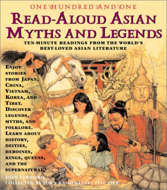

Greedy: drawing of people with faces and the title " read - loud ancient myths and legends "
Beam: drawing of people with animals and the title " read - loud asian myths and legends "

Similarity at index 166: 0.7368421052631579
Image name: 1580132618.jpg


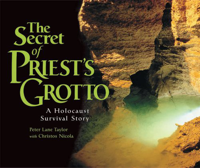

Greedy: drawing of a man in a river and the title " the secret of priest's grotto "
Beam: picture of a priest's grotto with the title " the secret of priest's grotto "

Similarity at index 167: 0.8059701492537313
Image name: 1583942335.jpg


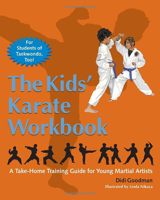

Greedy: image of karate people with the title " the kid's karate workbook "
Beam: drawing of a karate kid and the title " the kid's karate workbook "

Similarity at index 168: 0.562962962962963
Image name: 1587215365.jpg


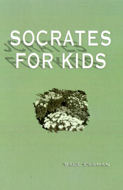

Greedy: picture of a green background with the title " dromedary "
Beam: picture of a hand holding a sphere with white flowers and the title " greek "

Similarity at index 169: 0.8592592592592593
Image name: 1589251520.jpg


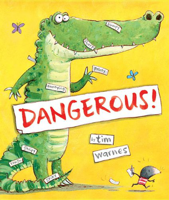

Greedy: drawing of a green crocodile with the captions " danger! " and " dangerous! "
Beam: drawing of a green crocodile with the captions " danger! "

Similarity at index 170: 0.7575757575757576
Image name: 1596439319.jpg


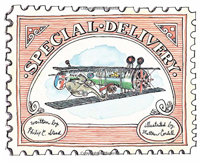

Greedy: drawing of a green airplane and the title " special delectable "
Beam: drawing of a airplane in the sky with the title " special delivery "

Similarity at index 171: 0.7432432432432432
Image name: 1601590393.jpg


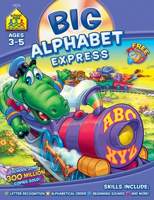

Greedy: drawing of a green dinosaur and the title " big letter express "
Beam: drawing of a green crocodile and a toy train with the title " big alphabet express "

Similarity at index 172: 0.8125
Image name: 1602130620.jpg


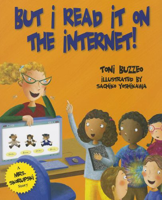

Greedy: drawing of a man with glasses and children with the title " but i read it on the internet! "
Beam: drawing of children and the title " but i read it on the internet! "

Similarity at index 173: 0.8571428571428571
Image name: 1606945521.jpg


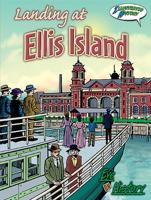

Greedy: drawing of people in a boat with the title " ellis island "
Beam: drawing of people in a building by a river with the title " ellis island "

Similarity at index 174: 0.6153846153846154
Image name: 1616892706.jpg


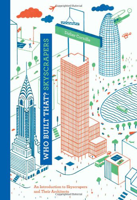

Greedy: drawing of a city with the caption " city "
Beam: drawing of a skyscraper in the city with the title " who built buildings "

Similarity at index 175: 0.946236559139785
Image name: 1624034063.jpg


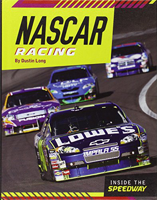

Greedy: picture of race cars with the title " nascar "
Beam: picture of three cars with the title " nascar "

Similarity at index 176: 0.9344262295081968
Image name: 1626722153.jpg


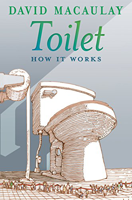

Greedy: drawing of a toilet bowl and the title " toilet how it works "
Beam: drawing of a toilet bowl and the title " lard how it works "

Similarity at index 177: 0.41935483870967744
Image name: 1627389512.jpg


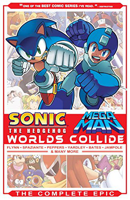

Greedy: drawing of a blue superhero with the title " sonic the battleman "
Beam: drawing of a man with blue hair and the captions " sonic nerd world collapsle " and " the end of the sonic world collaps

Similarity at index 178: 1.0
Image name: 162832113X.jpg


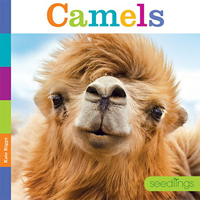

Greedy: picture of a camel with the title " camels "
Beam: picture of a camel with the title " camels "

Similarity at index 179: 0.7950310559006211
Image name: 1770492550.jpg


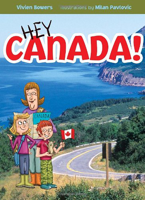

Greedy: drawing of two kids and a girl holding a flag by a road with the title " he canada! "
Beam: drawing of two children and a boy by the road with the title " hey canada! "

Similarity at index 180: 0.7338129496402878
Image name: 1783120088.jpg


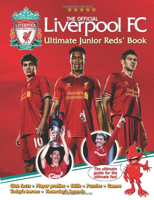

Greedy: drawing of soccer players with the title " liverpool fc ultimate junior red book "
Beam: picture of soccer players with the title " liverpool fc "

Similarity at index 181: 0.5354330708661418
Image name: 1856978656.jpg


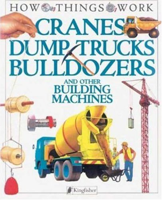

Greedy: drawing of a yellow truck with the title " cranes "
Beam: picture of a truck and the title " cranes dump trucks bulldozer bulldozers "

Similarity at index 182: 0.8048780487804879
Image name: 1869487192.jpg


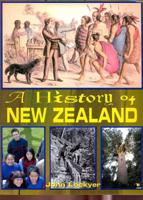

Greedy: drawing of people and a man with a dog and the caption " a history of new zealand "
Beam: drawing of people and a dog by a tree with the title " a history of new zealand "

Similarity at index 183: 0.8235294117647058
Image name: 1897522592.jpg


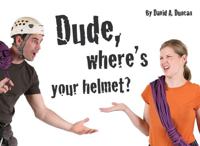

Greedy: picture of two boys and a helmet with the title " dude, where's your helmet? "
Beam: picture of a man and a girl with the caption " dude, where's your helmet? "

Similarity at index 184: 0.8396946564885496
Image name: 1908985348.jpg


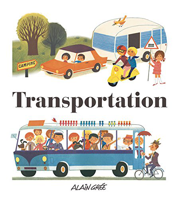

Greedy: drawing of people riding a bus and the title " transportation "
Beam: drawing of cars, people, and a bus with the title " transportation "

Similarity at index 185: 0.6548672566371682
Image name: 1909263087.jpg


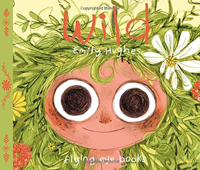

Greedy: drawing of a smiling girl with the title " wild "
Beam: drawing of a face with big eyes and the title " wildy hunchney "

Similarity at index 186: 0.6106870229007634
Image name: 1939352541.jpg


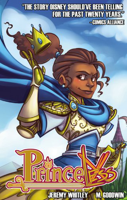

Greedy: drawing of a woman holding a golden sculpt with the title " dan hero "
Beam: drawing of a woman with a blue cape and the title " diffreg "

Similarity at index 187: 0.6534653465346535
Image name: 9380028768.jpg


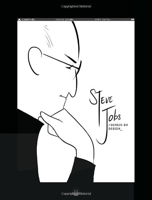

Greedy: drawing of a man with the title " steedelvias "
Beam: drawing of a man with glasses and the caption " john "

Similarity at index 188: 0.8761904761904762
Image name: 9509080004.jpg


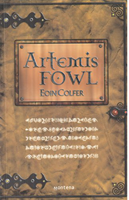

Greedy: drawing of a bird with the title " artemis fowl "
Beam: drawing of a letter fowl with the title " artemis fowl "

Similarity at index 189: 0.7839195979899497
Image name: 9683803148.jpg


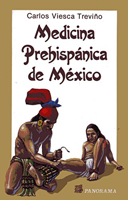

Greedy: drawing of a man and a woman with red hat and a mexican man with the title " my precharosa del mexico "
Beam: drawing of a man and a woman with a red hat next to the title " the peoples delicata de mexico "



In [28]:
for index, row in df.iterrows():
    compare_captions(index)